# Рынок заведений общественного питания Москвы

# Описание данных

Файл moscow_places.csv:

•	name — название заведения;

•	address — адрес заведения;

•	category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

•	hours — информация о днях и часах работы;

•	lat — широта географической точки, в которой находится заведение;

•	lng — долгота географической точки, в которой находится заведение;

•	rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

•	price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

•	avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона и так далее;

•	middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»;

•	middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»;

•	chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);

•	district — административный район, в котором находится заведение, например Центральный административный округ;

•	seats — количество посадочных мест.


# Ход работы

Шаг 1. Загрузить данные и изучить общую информацию

Шаг 2. Выполнить предобработку данных

•	Создать столбец street с названиями улиц из столбца с адресом.

•	Создать столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

Шаг 3. Анализ данных

Шаг 4. Детализировать исследование: открытие кофейни

Шаг 5. Подготовить презентацию
https://disk.yandex.ru/i/jRPpuPO5IZ2yzA


## Загрузить данные и изучить общую информацию

In [1]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
import plotly.graph_objs as go
import plotly.express as px
import warnings
import folium
import json
from folium.plugins import MarkerCluster
import re
warnings.filterwarnings('ignore')
import plotly.io as pio
pio.renderers.default='notebook'

In [2]:
sns.set_palette('pastel')
sns.set_style('dark')

Заданы цветовые параметры для библиотеки seaborn

In [3]:
data = pd.read_csv('/datasets/moscow_places.csv')

## Выполнить предобработку данных

In [4]:
data.info()
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
data.duplicated().sum()

0

In [6]:
data.duplicated(subset=['name', 'address']).sum()

0

Явных дубликатов и дубликатов по сочетанию имя+адрес нет

In [7]:
data.nunique()

name                 5614
category                8
address              5753
district                9
hours                1307
lat                  8209
lng                  8258
rating                 41
price                   4
avg_bill              897
middle_avg_bill       230
middle_coffee_cup      96
chain                   2
seats                 229
dtype: int64

In [8]:
data['name']=data['name'].str.lower()
data['name']=data['name'].str.strip()

In [9]:
data['name']=data['name'].str.replace('ё','е')
data['name'].nunique()

5506

Убраны пропуски в названиях, однако дальше считаю не стоит вносить какие-либо изменения, так как возможно искажение заданных данных

•	Создать столбец street 

In [10]:
data['street'] = [re.split('\,', x)[1] for x in data['address']]
data['street'] = data['street'].str.lstrip()
data['street_spell'] = [1 if (
    'ул.' or 'пер.' or 'ш.' or 'пр.' or 'б.' or 'бул.') in x else 0 for x in data['street']]
     

data[data['street_spell'] > 0]     

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,street_spell
2495,сеть поминальных залов,кафе,"Москва, ул. Ярославская, 8, корп. 1",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.817542,37.647486,4.5,NaN,NaN,NaN,NaN,1,NaN,ул. Ярославская,1
6847,jeffrey's coffee,кофейня,"Москва, ул. Профсоюзная, д.104",Юго-Западный административный округ,NaN,55.641920,37.523465,4.7,NaN,NaN,NaN,NaN,1,NaN,ул. Профсоюзная,1


```python
data['address'].str.split(', ').str[1]
```

In [11]:
data[data['street'] == 'Ярославская улица'].head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,street_spell
2131,сицилия,ресторан,"Москва, Ярославская улица, 13А, стр. 1",Северо-Восточный административный округ,"пн-чт 11:00–23:00; пт,сб 11:00–00:00; вс 11:00...",55.819282,37.644522,4.4,NaN,NaN,NaN,NaN,1,200.0,Ярославская улица,0
2159,дизайн,ресторан,"Москва, Ярославская улица, 8, корп. 8",Северо-Восточный административный округ,"ежедневно, 07:45–21:30",55.816993,37.648040,4.7,NaN,NaN,NaN,NaN,0,49.0,Ярославская улица,0
2169,лофт кофе деталька,кофейня,"Москва, Ярославская улица, 10, корп. 2",Северо-Восточный административный округ,"ежедневно, 09:00–23:00",55.820685,37.647890,5.0,NaN,NaN,NaN,NaN,0,95.0,Ярославская улица,0
2171,хинкали-gали!,кафе,"Москва, Ярославская улица, 10, корп. 2",Северо-Восточный административный округ,"ежедневно, 09:00–23:00",55.820487,37.647843,4.4,NaN,NaN,NaN,NaN,1,95.0,Ярославская улица,0
2182,сим-сим,кафе,"Москва, Ярославская улица, 10, корп. 5",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.819084,37.648852,4.3,средние,Средний счёт:400–500 ₽,450.0,NaN,0,70.0,Ярославская улица,0


In [12]:
data[data['street'] == 'Профсоюзная улица'].head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,street_spell
5929,no name cafe,"бар,паб","Москва, Профсоюзная улица, 3",Юго-Западный административный округ,"пн-ср 12:00–21:00; чт,пт 12:00–23:00",55.685714,37.572632,4.4,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,190.0,Профсоюзная улица,0
5967,baleno,ресторан,"Москва, Профсоюзная улица, 12",Юго-Западный административный округ,"пн-пт 09:00–23:00; сб,вс 10:00–23:00",55.685291,37.570001,4.6,средние,Средний счёт:от 800 ₽,800.0,NaN,0,52.0,Профсоюзная улица,0
5971,штолле,булочная,"Москва, Профсоюзная улица, 4",Юго-Западный административный округ,"ежедневно, 08:00–22:00",55.687148,37.572045,4.4,NaN,NaN,NaN,NaN,1,26.0,Профсоюзная улица,0
5974,траттория да чикко,пиццерия,"Москва, Профсоюзная улица, 13/12",Юго-Западный административный округ,"пн-чт 09:00–23:00; пт,сб 11:00–00:00; вс 11:00...",55.680727,37.566606,4.4,высокие,Средний счёт:1500–2500 ₽,2000.0,NaN,0,48.0,Профсоюзная улица,0
6045,шоколадница,кофейня,"Москва, Профсоюзная улица, 19",Юго-Западный административный округ,"ежедневно, круглосуточно",55.678665,37.564330,4.3,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,48.0,Профсоюзная улица,0


In [13]:
data['street'] = [x.replace('ул. Ярославская','Ярославская улица') for x in data['street']]
data['street'] = [x.replace('ул. Профсоюзная','Профсоюзная улица') for x in data['street']]

Созданный столбец streets отредактирован под единый стандарт '"название"+ улица'

•	Создать столбец is_24/7

In [14]:
data['is_24/7'] = [1 if x == 'ежедневно, круглосуточно' else 0 for x in data['hours']]

```python
data['hours'].str.contains('ежедневно, круглосуточно')

```

Вывод:

1) При обработке было замечено большое количество пропусков во всех столбцах, однако пропуски решено оставить и анализировать только доступную часть информации.

2) Явных дубликатов не обнаружено, дубликатов по сочетанию названия+адреса не обнаружено.

3) Новый столбец streets создан и приведен к единому стандарту, создан столбец 'is_24/7'.

## Анализ данных

•	Какие категории заведений представлены в данных?

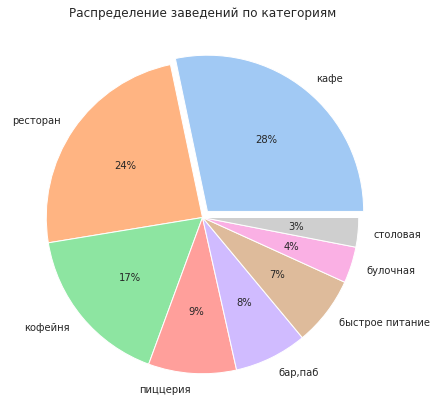

In [15]:
plt.figure(figsize=(7,9))
plt.title('Распределение заведений по категориям')

df = list(data['category'].value_counts())

y_axis = df
max_val = max(y_axis)
max_index = y_axis.index(max_val)
explode = tuple([0 if i!=max_index else 0.05 for i in range(len(y_axis))])

plt.pie(df, labels=data['category'].unique(), explode=explode, autopct='%.0f%%')
plt.show()

Большая часть из предствленных заведений - кафе и рестораны, столовых и булочных меньше всего.

•	Исследовать количество посадочных мест в местах по категориям

In [16]:
x = data[data['seats'] < np.quantile(data[~data['seats'].isna()][
    'seats'], 0.95)].groupby('category')['seats'].median().sort_values()
y = data[data['seats'] < np.quantile(data[~data['seats'].isna()][
    'seats'], 0.95)].groupby('category')['seats'].median().index

fig = px.bar(data, x=x, y=y, title='Медианное количество посадочных мест по категории предприятия')

fig.update_layout(xaxis_title='Количество посадочных мест',
                   yaxis_title='Категория предприятия')

fig.show()

Больше всего посадочных мест в столовых и ресторанах, наименьшее количество у баров, пабов

•	Рассмотреть и изобразить соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [17]:
fig = go.Figure(go.Pie(
    labels=['Несетевые', 'Сетевые'],
    values = data['chain'].value_counts().to_list(), title='Cоотношение сетевых и несетевых заведений по всем улицам Москвы'))
fig.update_traces(textposition='inside', textinfo='percent+label', pull=[0,0.2])
fig.show()

Больше половины несетевых заведений

•	Какие категории заведений чаще являются сетевыми? 

In [18]:
chain_c = data[data['chain'] == 1]    
chain_c = chain_c['category'].value_counts()
chain_c

кафе               779
ресторан           730
кофейня            720
пиццерия           330
быстрое питание    232
бар,паб            169
булочная           157
столовая            88
Name: category, dtype: int64

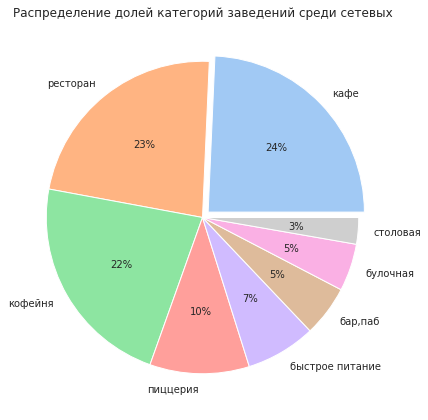

In [19]:
plt.figure(figsize=(7,9))
plt.title('Распределение долей категорий заведений среди сетевых')

df = list(chain_c)

y_axis = df
max_val = max(y_axis)
max_index = y_axis.index(max_val)
explode = tuple([0 if i!=max_index else 0.05 for i in range(len(y_axis))])

plt.pie(df, labels=chain_c.index, explode=explode, autopct='%.0f%%')
plt.show()

Наибольшая доля сетевых категорий заведений представлена категориями кафе, ресторанов и кофеен

•	Сгруппировать данные по названиям заведений и найти топ-15 популярных сетей в Москве. 

In [20]:
top15_c = data[data['chain'] == 1]['name'].value_counts().head(15)
top15_c

шоколадница                            120
домино'с пицца                          76
додо пицца                              74
one price coffee                        71
яндекс лавка                            69
cofix                                   65
prime                                   50
хинкальная                              44
кофепорт                                42
кулинарная лавка братьев караваевых     39
теремок                                 38
чайхана                                 37
буханка                                 32
cofefest                                32
му-му                                   27
Name: name, dtype: int64

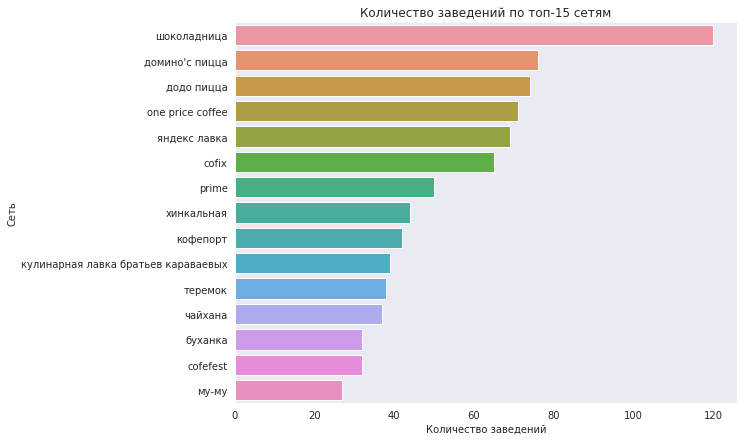

In [21]:
y = top15_c.index
x = top15_c

plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=top15_c.reset_index())

plt.title('Количество заведений по топ-15 сетям')
plt.xlabel('Количество заведений')
plt.ylabel('Сеть')

plt.show()

Шоколадница заметно популярнее других названий топа 15ти

На 2,3 местах расположились две пиццерии

Шоколадница, Домино'с пицца, Додо пицца, Яндекс Лавка, Теремок и Чайхана довольно известные заведения

Можно изучить долю заведений 24/7 среди топ-15 сетей

In [22]:
top15_c = data[data['name'].isin(list(top15_c.index))]
     

top15_c.groupby('name')['category'].unique().reset_index()

,name,category
0,cofefest,"[кофейня, кафе]"
1,cofix,[кофейня]
2,one price coffee,[кофейня]
3,prime,"[ресторан, кафе]"
4,буханка,"[булочная, кофейня, кафе]"
5,додо пицца,[пиццерия]
6,домино'с пицца,[пиццерия]
7,кофепорт,[кофейня]
8,кулинарная лавка братьев караваевых,[кафе]
9,му-му,"[кафе, ресторан, кофейня, быстрое питание, пиц..."


In [23]:
top15_c.groupby('name')['is_24/7'].sum().sort_values(ascending=False)

name
шоколадница                            17
чайхана                                11
яндекс лавка                            8
cofix                                   2
хинкальная                              2
one price coffee                        1
му-му                                   1
cofefest                                0
prime                                   0
буханка                                 0
додо пицца                              0
домино'с пицца                          0
кофепорт                                0
кулинарная лавка братьев караваевых     0
теремок                                 0
Name: is_24/7, dtype: int64

In [24]:
print('Доля заведений 24/7 среди топ-15 сетей:', round(top15_c['is_24/7'].mean(),2))

Доля заведений 24/7 среди топ-15 сетей: 0.05


Лишь малая часть (5% всех сетевых заведений) относятся к топ-15 сетей, которые работают 24/7.

•	Какие административные районы Москвы присутствуют в датасете? 

In [25]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [26]:
sao = data[data['district'] == 'Северный административный округ'].groupby('category')['name'].count().sort_values(ascending=False)
uao = data[data['district'] == 'Южный административный округ'].groupby('category')['name'].count().sort_values(ascending=False)
svao = data[data['district'] == 'Северо-Восточный административный округ'].groupby('category')['name'].count().sort_values(ascending=False)
szao = data[data['district'] == 'Северо-Западный административный округ'].groupby('category')['name'].count().sort_values(ascending=False)
csao = data[data['district'] == 'Центральный административный округ'].groupby('category')['name'].count().sort_values(ascending=False)
vao = data[data['district'] == 'Восточный административный округ'].groupby('category')['name'].count().sort_values(ascending=False)
zao = data[data['district'] == 'Западный административный округ'].groupby('category')['name'].count().sort_values(ascending=False)
uvao = data[data['district'] == 'Юго-Восточный административный округ'].groupby('category')['name'].count().sort_values(ascending=False)
uzao = data[data['district'] == 'Юго-Западный административный округ'].groupby('category')['name'].count().sort_values(ascending=False)

In [27]:
plot = go.Figure(data=[go.Bar(
    name='САО',
    x=sao.index,
    y=sao.values
),
    go.Bar(
    name='ЮАО',
    x=uao.index,
    y=uao.values
),
    go.Bar(
    name='ВАО',
    x=vao.index,
    y=vao.values    
),
    go.Bar(
    name='ЗАО',
    x=zao.index,
    y=zao.values    
),
    go.Bar(
    name='ЦАО',
    x=csao.index,
    y=csao.values    
),
    go.Bar(
    name='СЗАО',
    x=szao.index,
    y=szao.values    
),
    go.Bar(
    name='СВАО',
    x=svao.index,
    y=svao.values    
),
    go.Bar(
    name='ЮЗАО',
    x=uzao.index,
    y=uzao.values    
),
    go.Bar(
    name='ЮВАО',
    x=uvao.index,
    y=uvao.values    
)], 
    layout= {'title': 'Распределение категорий заведений по округам.'})

plot.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=list([
                dict(label="Все",
                     method="update",
                     args=[{"visible": [True, True, True, True, True, True, True, True, True]}]),
                dict(label="САО",
                     method="update",
                     args=[{"visible": [True, False, False, False, False, False, False, False, False]}]),
                dict(label="ЮАО",
                     method="update",
                     args=[{"visible": [False, True, False, False, False, False, False, False, False]}]),
                dict(label="ВАО",
                     method="update",
                     args=[{"visible": [False, False, True, False, False, False, False, False, False]}]),
                dict(label="ЗАО",
                     method="update",
                     args=[{"visible": [False, False, False, True, False, False, False, False, False]}]),
                dict(label="ЦАО",
                     method="update",
                     args=[{"visible": [False, False, False, False, True, False, False, False, False]}]),
                dict(label="СЗАО",
                     method="update",
                     args=[{"visible": [False, False, False, False, False, True, False, False, False]}]),
                dict(label="СВАО",
                     method="update",
                     args=[{"visible": [False, False, False, False, False, False, True, False, False]}]),
                dict(label="ЮЗАО",
                     method="update",
                     args=[{"visible": [False, False, False, False, False, False, False, True, False]}]),
                dict(label="ЮВАО",
                     method="update",
                     args=[{"visible": [False, False, False, False, False, False, False, False, True]}]),
            ]),
        )
    ], barmode='stack', 
    autosize=False, 
    width=900, 
    height=900)

plot.show()

Самые популярные категории по округам: кафе, кофейни, рестораны.

В категории "кафе" максимальное количество наблюдается в ЦАО и минимальное в СЗАО.

В категории "кофейня" максимальное количество наблюдается в ЦАО и минимальное в СЗАО.

В категории "ресторан" максимальное количество наблюдается в ЦАО и минимальное в СЗАО.

В СЗАО меньшая концентрация по всем популярным категориям по округам. Возможно, есть шанс открыть заведения данных категорий в этом районе, быть "первопроходцем", стать востребованным

•	Визуализировать распределение средних рейтингов по категориям заведений

In [28]:
rating_ct = data.groupby('category')['rating'].mean().sort_values(ascending=False)
rating_ct

category
бар,паб            4.387712
пиццерия           4.301264
ресторан           4.290357
кофейня            4.277282
булочная           4.268359
столовая           4.211429
кафе               4.123886
быстрое питание    4.050249
Name: rating, dtype: float64

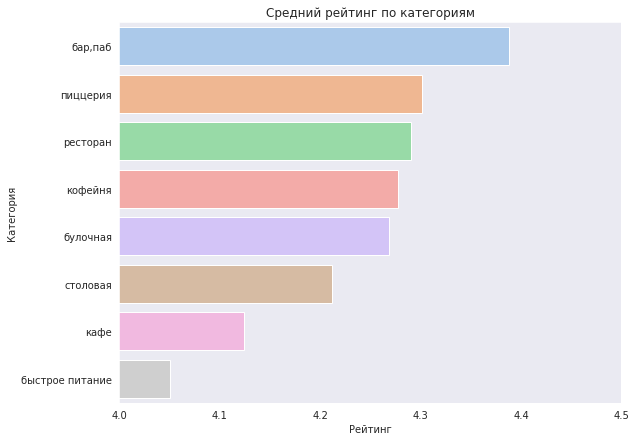

In [29]:
x = rating_ct
y = rating_ct.index

plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=rating_ct.reset_index())
plt.xlim(4, 4.5)

plt.title('Средний рейтинг по категориям')
plt.xlabel('Рейтинг')
plt.ylabel('Категория')

plt.show()

Рейтинг по категориям заведений примерно одинаковый

Наивысший средний рейтинг у баров,пабов, пиццерий и ресторанов

•	Построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [30]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))
 

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [31]:
from folium import Map, Choropleth

state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
df = data.groupby('district')['rating'].median()
Choropleth(
    geo_data=state_geo,
    data=df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

m


Заведения с наивысшими рейтингами сконцентрированы в ЦАО, в САО и СЗАО средний рейтинг чуть ниже, наименьший в ЮВАО.

•	Отобразить все заведения датасета на карте с помощью кластеров 

In [32]:
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)


data.apply(create_clusters, axis=1)

m

•	Найти топ-15 улиц по количеству заведений

In [33]:
data.groupby('street')['name'].count().sort_values(ascending=False).head(15)

street
проспект Мира             184
Профсоюзная улица         123
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Каширское шоссе            77
Варшавское шоссе           76
Ленинградское шоссе        70
МКАД                       65
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Name: name, dtype: int64

In [34]:
top_15_st = data[data['street'].isin(
    data.groupby('street')['name'].count()
    .sort_values(ascending=False).head(15).index)]

In [35]:
top_15_st_ct = top_15_st.groupby(['street', 'category'], as_index=False)['name'].count()
top_15_st_ct.rename({'name' : 'quantity'}, axis=1, inplace=True)

In [36]:
fig = px.bar(top_15_st_ct, x='street', y='quantity', color='category')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Распределение заведений и их категорий по топ-15 улицам',
                   xaxis_title='Улица',
                   yaxis_title='Распределение',
                   autosize=False,
                   width=900,
                   height=900,
                   xaxis={'categoryorder':'total descending'})
fig.show()

Наибольшее количество заведений на Проспекте Мира

Наибольшее количество кафе на проспекте Мира и МКАД, наименьшее - на Пятницкой

Наибольшее количество кофеен на проспекте Мира, наименьшее - на МКАДе и на улице Миклухо-Маклая

Наибольшее количество ресторанов на проспекте Мира и Ленинском проспекте, наименьшее - на МКАДе

Наибольшее количество пиццерий на Профсоюзной, проспекте Вернадского и проспекте Мира, наименьшее - на МКАДе

Наибольшее количество заведений категории быстрого питания на проспекте Мира, Профсоюзной, наименьшее на Кутузовском проспекте, Ленинградском проспекте, Ленинском проспекте

Наибольшее количество столовых на Варшавском шоссе, отсутствуют на улице Миклухо-Маклая и Пятницкой

Наибольшее количество баров, пабов на Ленинградском проспекте, проспекте Мира, наименьшее на МКАДе

Наибольшее количество булочных на Ленинградском проспекте, проспекте Мира, Профсоюзной, отсутствуют на улице Миклухо-Маклая, Люблинской, МКАДе, Варшавском и Каширском шоссе



•	Найти улицы, на которых находится только один объект общепита

In [37]:
one_st = data.groupby('street')['name'].count() == 1
one_st = one_st[one_st.values == True]
     

one_st = data[data['street'].isin(one_st.index)]
     

one_st.groupby('category')['street'].count().sort_values(ascending=False)

category
кафе               159
ресторан            93
кофейня             83
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: street, dtype: int64

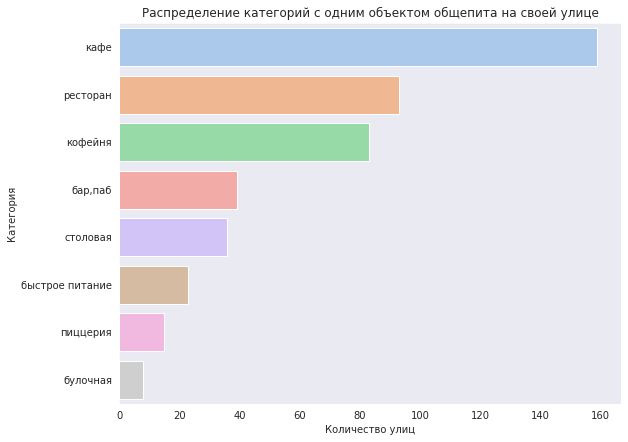

In [38]:
x = one_st.groupby('category')['street'].count().sort_values(ascending=False)
y = one_st.groupby('category')['street'].count().sort_values(ascending=False).index

plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=one_st.reset_index())

plt.title('Распределение категорий с одним объектом общепита на своей улице')
plt.xlabel('Количество улиц')
plt.ylabel('Категория')

plt.show()

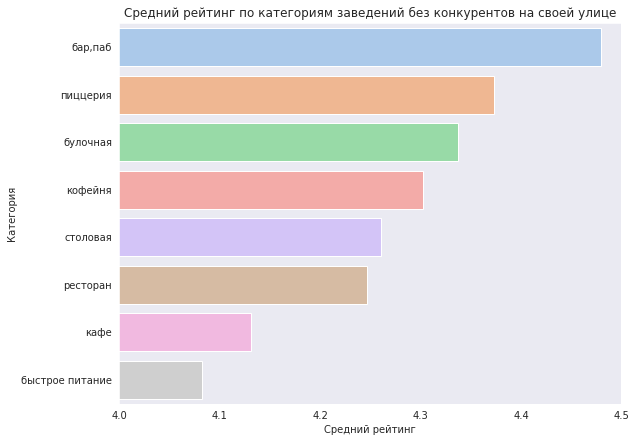

In [39]:
x = one_st.groupby('category')['rating'].mean().sort_values(ascending=False)
y = one_st.groupby('category')['rating'].mean().sort_values(ascending=False).index

plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=one_st.reset_index())
plt.xlim(4, 4.5)

plt.title('Средний рейтинг по категориям заведений без конкурентов на своей улице')
plt.xlabel('Средний рейтинг')
plt.ylabel('Категория')

plt.show()
     

In [40]:
one_st.groupby('district')['street'].count().sort_values(ascending=False)


district
Центральный административный округ         145
Северо-Восточный административный округ     54
Восточный административный округ            52
Северный административный округ             52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         17
Name: street, dtype: int64

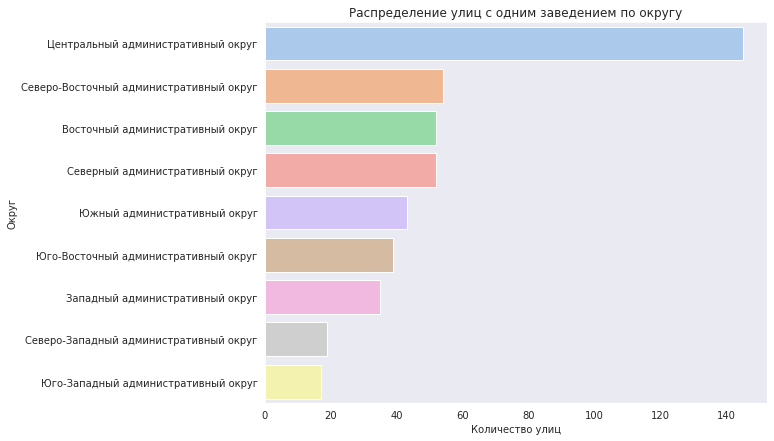

In [41]:
x = one_st.groupby('district')['street'].count().sort_values(ascending=False)
y = one_st.groupby('district')['street'].count().sort_values(ascending=False).index

plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=one_st.reset_index())

plt.title('Распределение улиц с одним заведением по округу')
plt.xlabel('Количество улиц')
plt.ylabel('Округ')

plt.show()

Топ-категория с одним объектом общепита на своей улице - кафе

Распределение средних рейтингов по категориям схоже с распределением для всей совокупности.

Больше всего улиц с одним заведением в ЦАО (тк в ЦАО больше всего улиц)

•	Построить фоновую картограмму (хороплет) с полученными значениями для каждого района

In [42]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

df = data[data['middle_avg_bill'] < np.quantile(data[~data['middle_avg_bill'].isna()][
    'middle_avg_bill'], 0.95)].groupby('district')[
    'middle_avg_bill'].median()

folium.Choropleth(
    geo_data=geo_json,
    data=df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(m)

m

In [43]:
print('Средний чек в центральном административном округе в отношении к остальным округам:', round(
    data[(data['middle_avg_bill'] < np.quantile(data[~data['middle_avg_bill'].isna()][
    'middle_avg_bill'], 0.95)) & (data['district'] == 'Центральный административный округ')][
    'middle_avg_bill'].mean() / 
    data[(data['middle_avg_bill'] < np.quantile(data[~data['middle_avg_bill'].isna()][
    'middle_avg_bill'], 0.95)) & (data['district'] != 'Центральный административный округ')][
    'middle_avg_bill'].mean(),2))

Средний чек в центральном административном округе в отношении к остальным округам: 1.3


Самый высокий средний чек - в ЦАО и ЗАО/Самый низкий средний чек в ЮАО, СВАО, ВАО и ЮВАО

Средний чек в ЦАО на 30% выше, чем в остальных округах.

***Общий Вывод***

1. Исследование количество объектов и посадочных мест общественного питания по категориям

- Большая часть из предствленных заведений - кафе, булочных и столовых меньше всего

- Больше всего посадочных мест в столовых и ресторанах, наименьшее количество у баров, пабов


2. Сетевые и Несетевые заведения

- Большая половина - несетевые заведения

- Наибольшая доля сетевых категорий заведений представлена категориями кафе, ресторанов и кофеен


3. Топ-15 популярных сетей в Москве

- Шоколадница заметно популярнее других названий топа 15ти

- На 2,3 местах расположились две пиццерии

- Шоколадница, Домино'с пицца, Додо пицца, Яндекс Лавка, Теремок и Чайхана довольно известные заведения

- Лишь малая часть (5% всех сетевых заведений) относятся к топ-15 сетей, которые работают 24/7

4. Категоризация заведений по районам

- Самые популярные категории по округам: кафе, кофейни, рестораны.

- В категории "кафе" максимальное количество наблюдается в ЦАО и минимальное в СЗАО.

- В категории "кофейня" максимальное количество наблюдается в ЦАО и минимальное в СЗАО.

- В категории "ресторан" максимальное количество наблюдается в ЦАО и минимальное в СЗАО.

- В СЗАО меньшая концентрация по всем популярным категориям по округам. Возможно, есть шанс открыть заведения данных категорий в этом районе, быть "первопроходцем", стать востребованным

5. Рейтинг заведений

- Рейтинг по категориям заведений примерно одинаковый

- Наивысший средний рейтинг у баров,пабов, пиццерий и ресторанов

- Заведения с наивысшими рейтингами сконцентрированы в ЦАО, в САО и СЗАО средний рейтинг чуть ниже, наименьший в ЮВАО.

6. Концентрация категорий заведений по улицам

- Наибольшее количество заведений на Проспекте Мира

- Наибольшее количество кафе на проспекте Мира и МКАД, наименьшее - на Пятницкой

- Наибольшее количество кофеен на проспекте Мира, наименьшее - на МКАДе и на улице Миклухо-Маклая

- Наибольшее количество ресторанов на проспекте Мира и Ленинском проспекте, наименьшее - на МКАДе

- Наибольшее количество пиццерий на Профсоюзной, проспекте Вернадского и проспекте Мира, наименьшее - на МКАДе

- Наибольшее количество заведений категории быстрого питания на проспекте Мира, Профсоюзной, наименьшее на Кутузовском проспекте, Ленинградском проспекте, Ленинском проспекте

- Наибольшее количество столовых на Варшавском шоссе, отсутствуют на улице Миклухо-Маклая и Пятницкой

- Наибольшее количество баров, пабов на Ленинградском проспекте, проспекте Мира, наименьшее на МКАДе

- Наибольшее количество булочных на Ленинградском проспекте, проспекте Мира, Профсоюзной, отсутствуют на улице Миклухо-Маклая, Люблинской, МКАДе, Варшавском и Каширском шоссе

7. Улицы с одним заведением

- Топ-категория с одним объектом общепита на своей улице - кафе

- Распределение средних рейтингов по категориям схоже с распределением для всей совокупности.

- Больше всего улиц с одним заведением в ЦАО (тк в ЦАО больше всего улиц)

8. Средний чек

- Самый высокий средний чек - в ЦАО и ЗАО/Самый низкий средний чек в ЮАО, СВАО, ВАО и ЮВАО.

- Средний чек в ЦАО на 30% выше, чем в остальных округах.

## Открытие кофейни

•	Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [44]:
coffee = data[data['category'] == 'кофейня']
     
print('Всего кофеен в Москве:', len(coffee))
print('Доля круглосуточных кофеен:', round(len(coffee[coffee['is_24/7'] == 1]) / len(coffee),2))
     

Всего кофеен в Москве: 1413
Доля круглосуточных кофеен: 0.04


In [45]:
coffee.groupby('district')['name'].count().sort_values(ascending=False)

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: name, dtype: int64

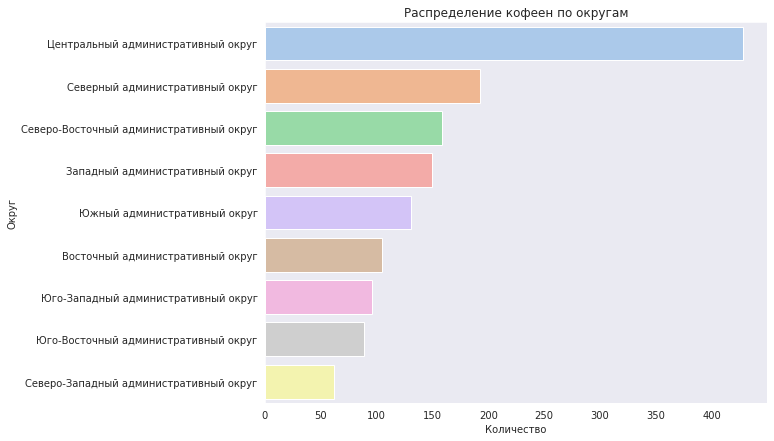

In [46]:
x = coffee.groupby('district')['name'].count().sort_values(ascending=False)
y = coffee.groupby('district')['name'].count().sort_values(ascending=False).index

fig = plt.figure(figsize=(9,7))
sns.barplot(x=x, y=y, data=coffee.reset_index())

plt.title('Распределение кофеен по округам')
plt.xlabel('Количество')
plt.ylabel('Округ')

plt.show()

In [47]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

df = coffee.groupby('district')['name'].count()

folium.Choropleth(
    geo_data=geo_json,
    data=df,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.4,
    legend_name='Концентрация кофеен по районам',
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee.apply(create_clusters, axis=1)

m

В ЦАО больше, чем в 2 раза больше кофеен, чем в любом другом округе

Меньше всего в СЗАО, ЮВАО, ЮЗАО, ВАО

Дальше от центра - меньше кофеен

•	Какие у кофеен рейтинги? Как они распределяются по районам?

In [48]:
coffee.groupby('district')['rating'].mean().sort_values(ascending=False)

district
Центральный административный округ         4.336449
Северо-Западный административный округ     4.325806
Северный административный округ            4.291710
Юго-Западный административный округ        4.283333
Восточный административный округ           4.282857
Южный административный округ               4.232824
Юго-Восточный административный округ       4.225843
Северо-Восточный административный округ    4.216981
Западный административный округ            4.195333
Name: rating, dtype: float64

In [49]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10)

df = coffee.groupby('district')['rating'].mean()

folium.Choropleth(
    geo_data=geo_json,
    data=df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по округам',
).add_to(m)

marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee.apply(create_clusters, axis=1)

m

Наиболее высокий средний рейтинг у кофеен расположенных в ЦАО , СЗАО и САО

•	На какую стоимость чашки капучино стоит ориентироваться при открытии?

In [50]:
coffee_price = coffee[coffee[
    'middle_coffee_cup'] < np.quantile(coffee[~coffee[
    'middle_coffee_cup'].isna()][
    'middle_coffee_cup'], 0.99)].groupby(['district', 'chain'],as_index=False)[
    'middle_coffee_cup'].mean()
coffee_price

,district,chain,middle_coffee_cup
0,Восточный административный округ,0,137.115385
1,Восточный административный округ,1,145.066667
2,Западный административный округ,0,196.600000
3,Западный административный округ,1,187.000000
4,Северный административный округ,0,170.619048
5,Северный административный округ,1,149.812500
6,Северо-Восточный административный округ,0,165.307692
7,Северо-Восточный административный округ,1,165.352941
8,Северо-Западный административный округ,0,161.777778
9,Северо-Западный административный округ,1,168.333333


In [51]:
chain_no='Не сетевая'
chain='Сетевая'
x=list(coffee_price['district'].unique())
y0=list(coffee_price[coffee_price['chain'] == 0][
    'middle_coffee_cup'])
y1=list(coffee_price[coffee_price['chain'] == 1][
    'middle_coffee_cup'])

fig = go.Figure(data=[
    go.Bar(name=chain_no, x=x, y=y0),
    go.Bar(name=chain, x=x, y=y1)
])

fig.update_layout(title='Средняя стоимость чашки капучино по кофейням', 
                  barmode='group', 
                  xaxis={'categoryorder':'total descending'})
fig.show()

In [52]:
print('Средняя стоимость чашки капучино', round(data[data[
    'middle_coffee_cup'] < np.quantile(data[~data[
    'middle_coffee_cup'].isna()][
    'middle_coffee_cup'], 0.99)][
    'middle_coffee_cup'].mean(),1), 'р.')
print('Средняя стоимость чашки капучино в несетевой кофейне', round(
    coffee_price[coffee_price['chain'] == 0][
        'middle_coffee_cup'].mean(),1), 'р.')

print('Средняя стоимость чашки капучино в сетевой кофейне', round(
    coffee_price[coffee_price['chain'] == 1][
        'middle_coffee_cup'].mean(),1), 'р.')

Средняя стоимость чашки капучино 170.6 р.
Средняя стоимость чашки капучино в несетевой кофейне 170.4 р.
Средняя стоимость чашки капучино в сетевой кофейне 162.1 р.


Почти во всех округах в несетевых кофейнях средняя стоимость чашки капучино дороже, кроме СЗАО, ЮВАО, ВАО.

**Рекомендации**

Открыть кофейню можно в СЗАО, тк там наименьшая конкуренция, есть восстребованность, можно попробовать установить чуть более высокую стоимость. Но в СЗАО рынок кофеен высокорейтинговый, это может указывать на хорошее качество действующих кофеен, но в условии задачи указано, что заказчики конкуренции не боятся. Также хорошим вариантом будет ЮАО, так как там конкуренция среди кофеен относительно небольшая и низкий средний рейтинг.


## Презентация

https://disk.yandex.ru/i/jRPpuPO5IZ2yzA